<a href="https://colab.research.google.com/github/AbakirH/CS301_Project_Group7/blob/main/CS301%20Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem Set 1

The TensorFlow Playground is a handy neural network simulator built by the TensorFlow team. In this exercise, you will train several binary classifiers in just a few clicks, and tweak the model’s architecture and its hyperparameters to gain some intuition on how neural networks work and what their hyperparameters do.

**1. Try training the default neural network by clicking the Run button (top left) Notice how it quickly finds a good solution for the classification task. The neurons in the first hidden layer have learned simple patterns, while the neurons in the second hidden layer have learned to combine the simple patterns of the first hidden layer into more complex patterns. Why that is?**

The neurons in the first layer only exhibit simple patterns while the second layer has a more complex pattern combinining multiple layers. The second layer uses the four neurons in the first layer and combines them. This occurs because of the applied weights that add some bias to the data. Complexity will increase as more layers are added to the network.




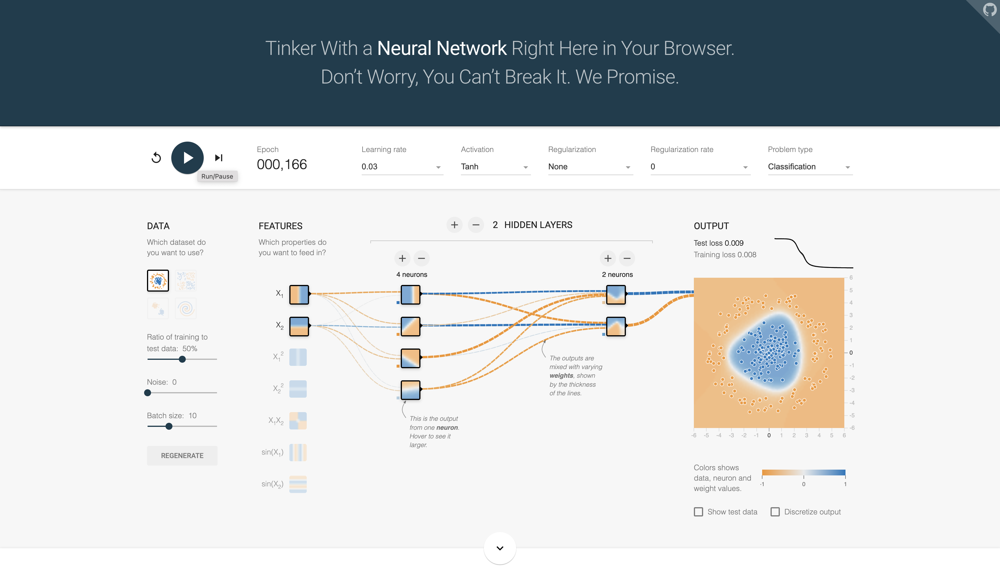

2. Activation functions. Try replacing the tanh activation function with a ReLU activation function, and train the network again. Does it find the solution faster or slower? Why is that?

The ReLU activation shows a linear activation function boundary which appears to be faster than the tanh function. The shape of the ReLU function is mostly responsible for this. In order to train deep neural networks and to be able to use stochastic gradient descent, an activation function was needed that looks and acts like a linear function, but is, in fact, a nonlinear function allowing complex relationships in the data to be learned. ReLu was created to solve this issue. 

The reason  RelU is faster is how the function works and that it does not activate all the neurons at the same time. Also because the RelU deriavtive computation is simple that it is either 0 or 1, which helps solve certain problems faster.




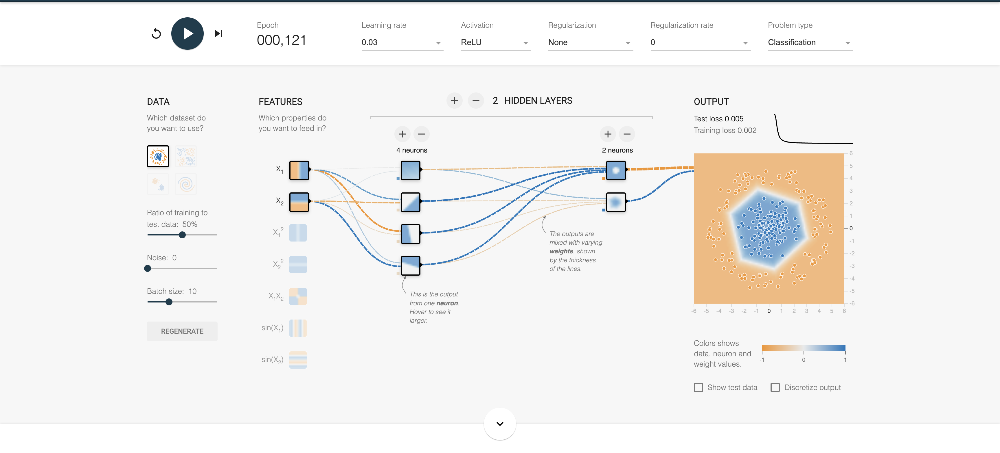

3.The risk of local minima. Modify the network architecture to have just one hidden layer with three neurons. Train it multiple times (to reset the network weights, click the Reset button next to the Play button). Why the training time has a wide variability?

The training time has a wide variability because the weights on the network's patterns can get trapped in a local minima, causing sometimes unpredictable and variable outcomes. This means the  network will continue to reach local minima and become stuck their.

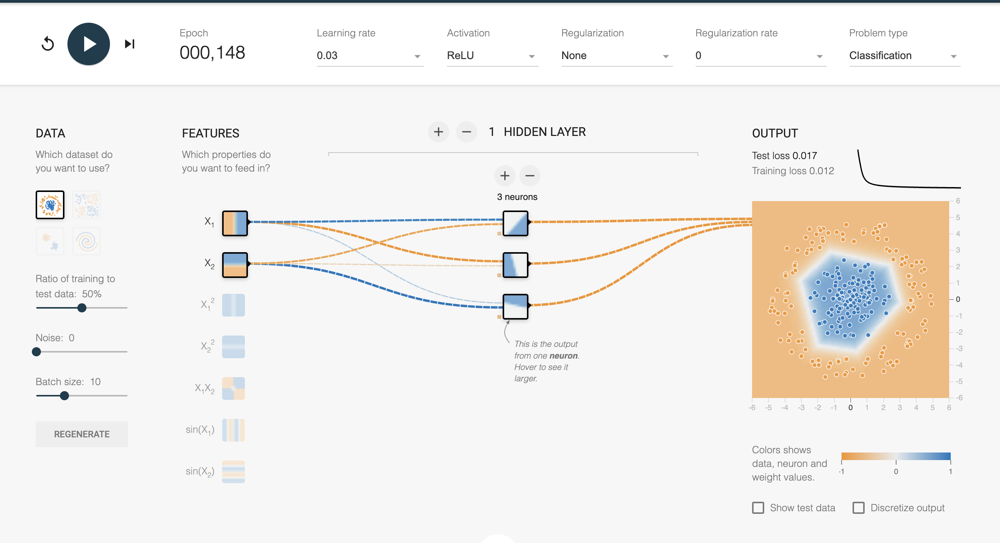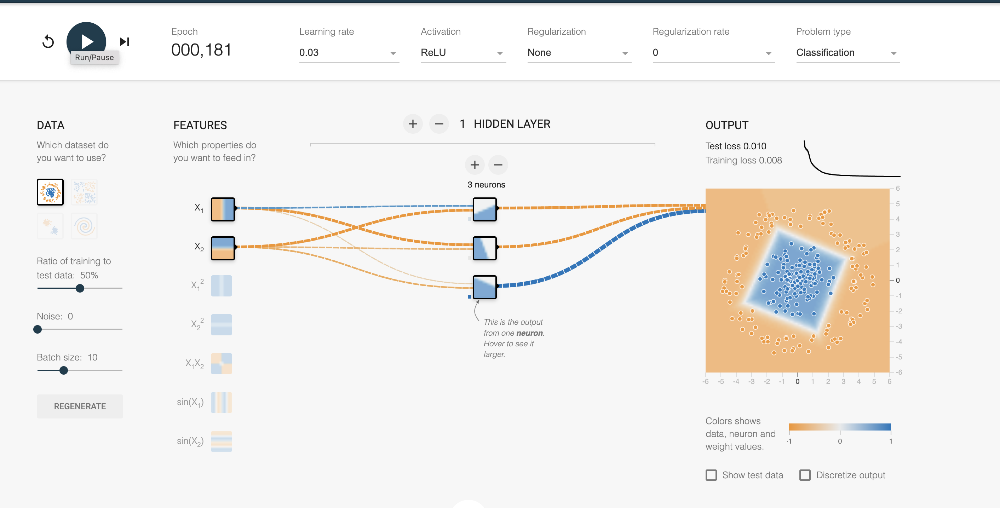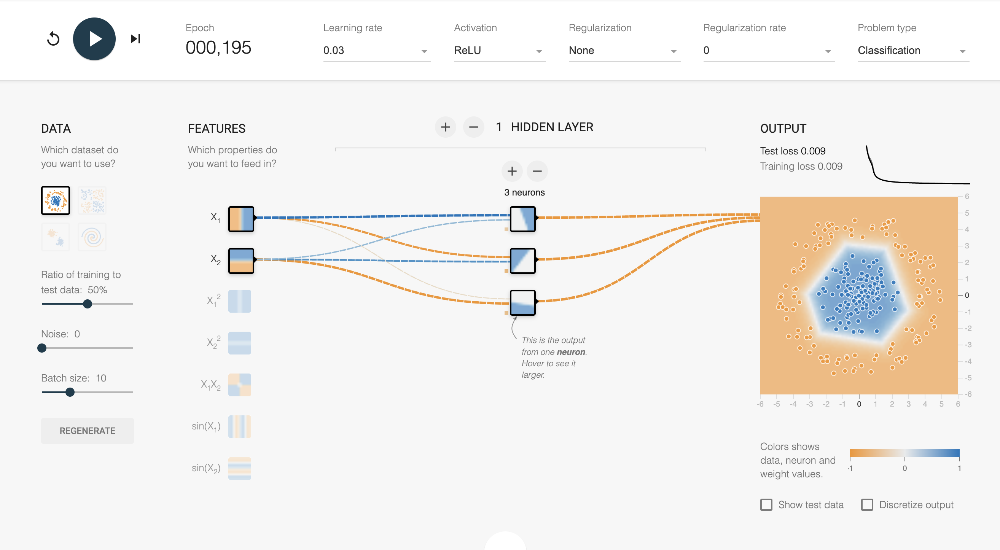

4. Remove one neuron to keep just two. Notice that the neural network is now incapable of finding a good solution - why that is?

With only two neurons, the training model proves to be unsuitable to find a proper solution. This is because the network does not have enough resources (engineering neurons) to find a good solution. This network is underfitting because of this and continues to reach local minima like the previous problem and gets stuck their.




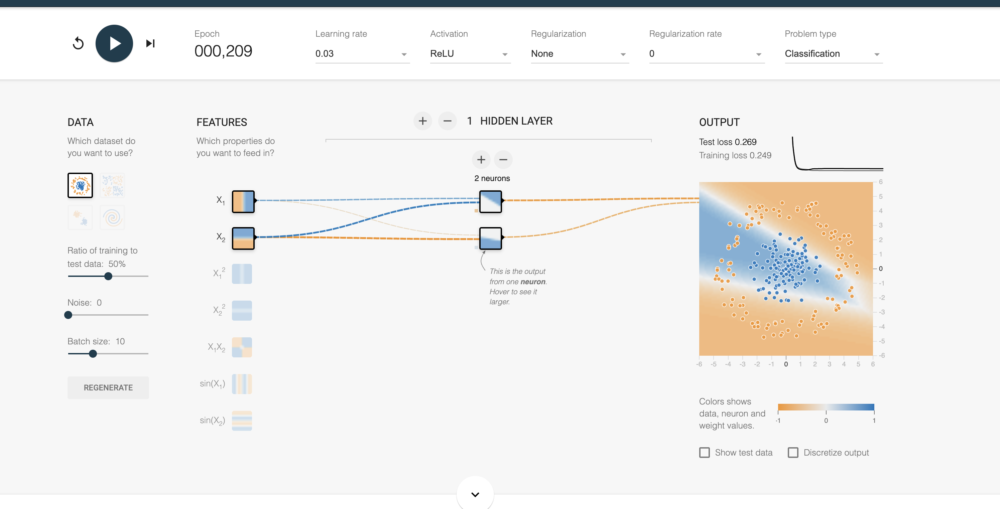

5. Set the number of neurons to eight, and train the network several times. Has the training time (time to convergence) improved? Why that is?

The training time has significantly improved because there is an abundance of resources (neurons) for the training model to find a solution. With so many neurons, the local minima can be compared to the global max. Also, this allows the network to have a lot of epochs to use to train itself.

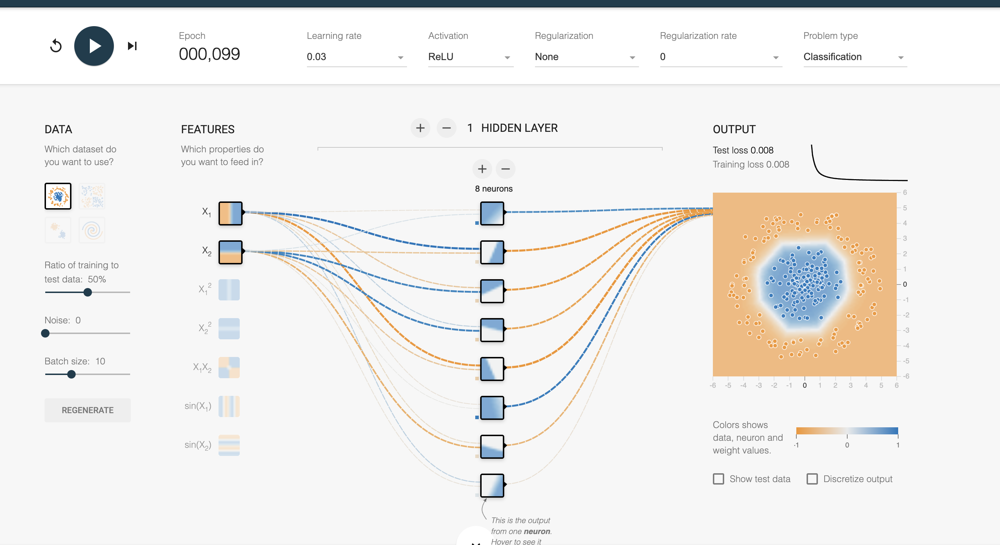

6. Select the spiral dataset (the bottom-right dataset under “DATA”), and change the network architecture to have four hidden layers with eight neurons each. Notice that training takes much longer and often gets stuck on plateaus for long periods of time. Also notice that the neurons in the highest layers (on the right) tend to evolve faster than the neurons in the lowest layers (on the left). Can you explain how this may be related to gradient flow through the network?

The issues related to this problem are similar to that of Vanishing Gradient Problem. The gradients (Deravitive of the wei are too small here which makes it difficult for the weights and key values to change. Another way to explain this is that this network might have problems with back propogation because as weights begin to move up the network the learning rate increases but these weights were initially small in the beginning so the learning rate was small orginally.

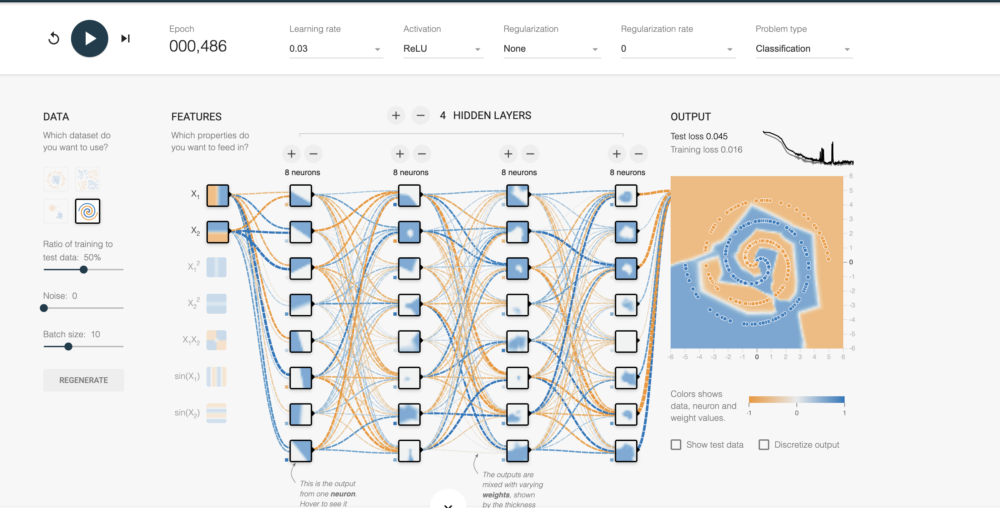


# Problem Set 2 (20 points)


## 1. (5 points) Submit your notebook URL that allows this notebook to be executed. 

The notebook that needs to run is in this code underneath this question

## This notebook by F. Chollet's original text is limited in describing the code - please consult the book for further explanations and figures. 

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
import keras
keras.__version__

'2.8.0'

In [ ]:
! pip install -q kaggle
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"abakirhanna","key":"aa9df15fc28dd9090f387d97c277d71c"}'}

In [ ]:
!mkdir /root/.kaggle/
!mv kaggle.json /root/.kaggle/kaggle.json

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json
!kaggle -v

Kaggle API 1.5.12


In [ ]:
%ls /root/.kaggle/

kaggle.json


In [ ]:
!kaggle competitions files -c dogs-vs-cats

name                   size  creationDate         
--------------------  -----  -------------------  
train.zip             543MB  2018-04-28 20:11:19  
test1.zip             271MB  2018-04-28 20:11:19  
sampleSubmission.csv   87KB  2018-04-28 20:11:19  


In [ ]:
!kaggle competitions download  -c dogs-vs-cats -p /content/kaggle/dogscats --force

100% 811M/812M [00:07<00:00, 96.8MB/s]
100% 812M/812M [00:07<00:00, 113MB/s] 


## Using convnets with small datasets

This notebook contains the code sample found in Chapter 5, Section 2 of [Deep Learning with Python](https://www.manning.com/books/deep-learning-with-python?a_aid=keras&a_bid=76564dff). Note that the original text features far more content, in particular further explanations and figures: in this notebook, you will only find source code and related comments.

## Training a convnet from scratch on a small dataset

Having to train an image classification model using only very little data is a common situation, which you likely encounter yourself in 
practice if you ever do computer vision in a professional context.

Having "few" samples can mean anywhere from a few hundreds to a few tens of thousands of images. As a practical example, we will focus on 
classifying images as "dogs" or "cats", in a dataset containing 4000 pictures of cats and dogs (2000 cats, 2000 dogs). We will use 2000 
pictures for training, 1000 for validation, and finally 1000 for testing.

In this section, we will review one basic strategy to tackle this problem: training a new model from scratch on what little data we have. We 
will start by naively training a small convnet on our 2000 training samples, without any regularization, to set a baseline for what can be 
achieved. This will get us to a classification accuracy of 71%. At that point, our main issue will be overfitting. Then we will introduce 
*data augmentation*, a powerful technique for mitigating overfitting in computer vision. By leveraging data augmentation, we will improve 
our network to reach an accuracy of 82%.

In the next section, we will review two more essential techniques for applying deep learning to small datasets: *doing feature extraction 
with a pre-trained network* (this will get us to an accuracy of 90% to 93%), and *fine-tuning a pre-trained network* (this will get us to 
our final accuracy of 95%). Together, these three strategies -- training a small model from scratch, doing feature extracting using a 
pre-trained model, and fine-tuning a pre-trained model -- will constitute your future toolbox for tackling the problem of doing computer 
vision with small datasets.

## The relevance of deep learning for small-data problems

You will sometimes hear that deep learning only works when lots of data is available. This is in part a valid point: one fundamental 
characteristic of deep learning is that it is able to find interesting features in the training data on its own, without any need for manual 
feature engineering, and this can only be achieved when lots of training examples are available. This is especially true for problems where 
the input samples are very high-dimensional, like images.

However, what constitutes "lots" of samples is relative -- relative to the size and depth of the network you are trying to train, for 
starters. It isn't possible to train a convnet to solve a complex problem with just a few tens of samples, but a few hundreds can 
potentially suffice if the model is small and well-regularized and if the task is simple. 
Because convnets learn local, translation-invariant features, they are very 
data-efficient on perceptual problems. Training a convnet from scratch on a very small image dataset will still yield reasonable results 
despite a relative lack of data, without the need for any custom feature engineering. You will see this in action in this section.

But what's more, deep learning models are by nature highly repurposable: you can take, say, an image classification or speech-to-text model 
trained on a large-scale dataset then reuse it on a significantly different problem with only minor changes. Specifically, in the case of 
computer vision, many pre-trained models (usually trained on the ImageNet dataset) are now publicly available for download and can be used 
to bootstrap powerful vision models out of very little data. That's what we will do in the next section.

For now, let's get started by getting our hands on the data.

## Downloading the data

The cats vs. dogs dataset that we will use isn't packaged with Keras. It was made available by Kaggle.com as part of a computer vision 
competition in late 2013, back when convnets weren't quite mainstream. You can download the original dataset at: 
`https://www.kaggle.com/c/dogs-vs-cats/data` (you will need to create a Kaggle account if you don't already have one -- don't worry, the 
process is painless).

The pictures are medium-resolution color JPEGs. They look like this:

![cats_vs_dogs_samples](https://s3.amazonaws.com/book.keras.io/img/ch5/cats_vs_dogs_samples.jpg)

Unsurprisingly, the cats vs. dogs Kaggle competition in 2013 was won by entrants who used convnets. The best entries could achieve up to 
95% accuracy. In our own example, we will get fairly close to this accuracy (in the next section), even though we will be training our 
models on less than 10% of the data that was available to the competitors.
This original dataset contains 25,000 images of dogs and cats (12,500 from each class) and is 543MB large (compressed). After downloading 
and uncompressing it, we will create a new dataset containing three subsets: a training set with 1000 samples of each class, a validation 
set with 500 samples of each class, and finally a test set with 500 samples of each class.

Here are a few lines of code to do this:

In [ ]:
import os, shutil

In [ ]:
!ls /content/kaggle/dogscats

!unzip -q /content/kaggle/dogscats/dogs-vs-cats.zip -d /content/kaggle/dogscats
# Unzip file
!unzip -q /content/kaggle/dogscats/train.zip -d /content/kaggle/dogscats

dogs-vs-cats.zip  subset


In [ ]:
!ls /content/kaggle/dogscats/
# !ls /content/kaggle/dogscats/Cat_Dog_data/subset

dogs-vs-cats.zip  sampleSubmission.csv	subset	test1.zip  train  train.zip


In [ ]:
# The path to the directory where the original
# dataset was uncompressed
original_dataset_dir = '/content/kaggle/dogscats/train'

# The directory where we will
# store our smaller dataset
base_dir = '/content/kaggle/dogscats/subset'
if not os.path.exists(base_dir):
  os.mkdir(base_dir)

# Directories for our training,
# validation and test splits
train_dir = os.path.join(base_dir, 'train')
if not os.path.exists(train_dir):
  os.mkdir(train_dir)

validation_dir = os.path.join(base_dir, 'validation')
if not os.path.exists(validation_dir):
  os.mkdir(validation_dir)

test_dir = os.path.join(base_dir, 'test')
if not os.path.exists(test_dir):
  os.mkdir(test_dir)

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
if not os.path.exists(train_cats_dir):
  os.mkdir(train_cats_dir)

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
if not os.path.exists(train_dogs_dir):
  os.mkdir(train_dogs_dir)

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
if not os.path.exists(validation_cats_dir):
  os.mkdir(validation_cats_dir)

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
if not os.path.exists(validation_dogs_dir):
  os.mkdir(validation_dogs_dir)

# Directory with our validation cat pictures
test_cats_dir = os.path.join(test_dir, 'cats')
if not os.path.exists(test_cats_dir):
  os.mkdir(test_cats_dir)

# Directory with our validation dog pictures
test_dogs_dir = os.path.join(test_dir, 'dogs')
if not os.path.exists(test_dogs_dir):
  os.mkdir(test_dogs_dir)

# Copy first 1000 cat images to train_cats_dir
fnames = ['cat.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(train_cats_dir, fname)
    shutil.copyfile(src, dst)

# Copy next 500 cat images to validation_cats_dir
fnames = ['cat.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(validation_cats_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy next 500 cat images to test_cats_dir
fnames = ['cat.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(test_cats_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy first 1000 dog images to train_dogs_dir
fnames = ['dog.{}.jpg'.format(i) for i in range(1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(train_dogs_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy next 500 dog images to validation_dogs_dir
fnames = ['dog.{}.jpg'.format(i) for i in range(1000, 1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(validation_dogs_dir, fname)
    shutil.copyfile(src, dst)
    
# Copy next 500 dog images to test_dogs_dir
fnames = ['dog.{}.jpg'.format(i) for i in range(1500, 2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir, fname)
    dst = os.path.join(test_dogs_dir, fname)
    shutil.copyfile(src, dst)

As a sanity check, let's count how many pictures we have in each training split (train/validation/test):

In [ ]:
print('total training cat images:', len(os.listdir(train_cats_dir)))

total training cat images: 1000


In [ ]:
print('total training dog images:', len(os.listdir(train_dogs_dir)))

total training dog images: 1000


In [ ]:
print('total validation cat images:', len(os.listdir(validation_cats_dir)))

total validation cat images: 500


In [ ]:
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))

total validation dog images: 500


In [ ]:
print('total test cat images:', len(os.listdir(test_cats_dir)))

total test cat images: 500


In [ ]:
print('total test dog images:', len(os.listdir(test_dogs_dir)))

total test dog images: 500



So we have indeed 2000 training images, and then 1000 validation images and 1000 test images. In each split, there is the same number of 
samples from each class: this is a balanced binary classification problem, which means that classification accuracy will be an appropriate 
measure of success.

## Building our network

We've already built a small convnet for MNIST in the previous example, so you should be familiar with them. We will reuse the same 
general structure: our convnet will be a stack of alternated `Conv2D` (with `relu` activation) and `MaxPooling2D` layers.

However, since we are dealing with bigger images and a more complex problem, we will make our network accordingly larger: it will have one 
more `Conv2D` + `MaxPooling2D` stage. This serves both to augment the capacity of the network, and to further reduce the size of the 
feature maps, so that they aren't overly large when we reach the `Flatten` layer. Here, since we start from inputs of size 150x150 (a 
somewhat arbitrary choice), we end up with feature maps of size 7x7 right before the `Flatten` layer.

Note that the depth of the feature maps is progressively increasing in the network (from 32 to 128), while the size of the feature maps is 
decreasing (from 148x148 to 7x7). This is a pattern that you will see in almost all convnets.

Since we are attacking a binary classification problem, we are ending the network with a single unit (a `Dense` layer of size 1) and a 
`sigmoid` activation. This unit will encode the probability that the network is looking at one class or the other.

In [ ]:
from keras import layers
from keras import models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

Let's take a look at how the dimensions of the feature maps change with every successive layer:

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

For our compilation step, we'll go with the `RMSprop` optimizer as usual. Since we ended our network with a single sigmoid unit, we will 
use binary crossentropy as our loss (as a reminder, check out the table in Chapter 4, section 5 for a cheatsheet on what loss function to 
use in various situations).

In [ ]:
from tensorflow import keras
from keras import optimizers

model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


## Data preprocessing

As you already know by now, data should be formatted into appropriately pre-processed floating point tensors before being fed into our 
network. Currently, our data sits on a drive as JPEG files, so the steps for getting it into our network are roughly:

* Read the picture files.
* Decode the JPEG content to RBG grids of pixels.
* Convert these into floating point tensors.
* Rescale the pixel values (between 0 and 255) to the [0, 1] interval (as you know, neural networks prefer to deal with small input values).

It may seem a bit daunting, but thankfully Keras has utilities to take care of these steps automatically. Keras has a module with image 
processing helper tools, located at `keras.preprocessing.image`. In particular, it contains the class `ImageDataGenerator` which allows to 
quickly set up Python generators that can automatically turn image files on disk into batches of pre-processed tensors. This is what we 
will use here.

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


Let's take a look at the output of one of these generators: it yields batches of 150x150 RGB images (shape `(20, 150, 150, 3)`) and binary 
labels (shape `(20,)`). 20 is the number of samples in each batch (the batch size). Note that the generator yields these batches 
indefinitely: it just loops endlessly over the images present in the target folder. For this reason, we need to `break` the iteration loop 
at some point.

In [ ]:
for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (20, 150, 150, 3)
labels batch shape: (20,)


Let's fit our model to the data using the generator. We do it using the `fit_generator` method, the equivalent of `fit` for data generators 
like ours. It expects as first argument a Python generator that will yield batches of inputs and targets indefinitely, like ours does. 
Because the data is being generated endlessly, the generator needs to know example how many samples to draw from the generator before 
declaring an epoch over. This is the role of the `steps_per_epoch` argument: after having drawn `steps_per_epoch` batches from the 
generator, i.e. after having run for `steps_per_epoch` gradient descent steps, the fitting process will go to the next epoch. In our case, 
batches are 20-sample large, so it will take 100 batches until we see our target of 2000 samples.

When using `fit_generator`, one may pass a `validation_data` argument, much like with the `fit` method. Importantly, this argument is 
allowed to be a data generator itself, but it could be a tuple of Numpy arrays as well. If you pass a generator as `validation_data`, then 
this generator is expected to yield batches of validation data endlessly, and thus you should also specify the `validation_steps` argument, 
which tells the process how many batches to draw from the validation generator for evaluation.

In [ ]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/30
100/100 [==============================] - 24s 125ms/step - loss: 0.6903 - acc: 0.5320 - val_loss: 0.6754 - val_acc: 0.5900
Epoch 2/30
100/100 [==============================] - 13s 133ms/step - loss: 0.6549 - acc: 0.6210 - val_loss: 0.6382 - val_acc: 0.6280
Epoch 3/30
100/100 [==============================] - 12s 122ms/step - loss: 0.6052 - acc: 0.6810 - val_loss: 0.5997 - val_acc: 0.6720
Epoch 4/30
100/100 [==============================] - 12s 120ms/step - loss: 0.5589 - acc: 0.7025 - val_loss: 0.5878 - val_acc: 0.6770
Epoch 5/30
100/100 [==============================] - 12s 122ms/step - loss: 0.5266 - acc: 0.7385 - val_loss: 0.6535 - val_acc: 0.6350
Epoch 6/30
100/100 [==============================] - 12s 122ms/step - loss: 0.4966 - acc: 0.7465 - val_loss: 0.6252 - val_acc: 0.6580
Epoch 7/30
100/100 [==============================] - 13s 125ms/step - loss: 0.4694 - acc: 0.7690 - val_loss: 0.5880 - val_acc: 0.6860
Epoch 8/30
100/100 [==============================] - 1

It is good practice to always save your models after training:

In [ ]:
model.save('cats_and_dogs_small_1.h5')

Let's plot the loss and accuracy of the model over the training and validation data during training:

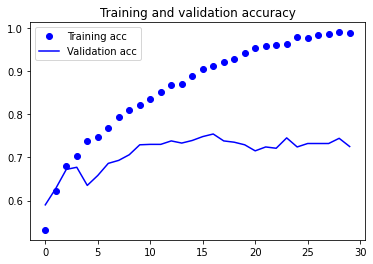

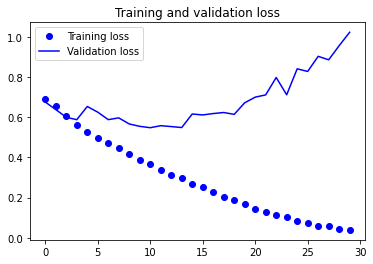

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

These plots are characteristic of overfitting. Our training accuracy increases linearly over time, until it reaches nearly 100%, while our 
validation accuracy stalls at 70-72%. Our validation loss reaches its minimum after only five epochs then stalls, while the training loss 
keeps decreasing linearly until it reaches nearly 0.

Because we only have relatively few training samples (2000), overfitting is going to be our number one concern. You already know about a 
number of techniques that can help mitigate overfitting, such as dropout and weight decay (L2 regularization). We are now going to 
introduce a new one, specific to computer vision, and used almost universally when processing images with deep learning models: *data 
augmentation*.

## Using data augmentation

Overfitting is caused by having too few samples to learn from, rendering us unable to train a model able to generalize to new data. 
Given infinite data, our model would be exposed to every possible aspect of the data distribution at hand: we would never overfit. Data 
augmentation takes the approach of generating more training data from existing training samples, by "augmenting" the samples via a number 
of random transformations that yield believable-looking images. The goal is that at training time, our model would never see the exact same 
picture twice. This helps the model get exposed to more aspects of the data and generalize better.

In Keras, this can be done by configuring a number of random transformations to be performed on the images read by our `ImageDataGenerator` 
instance. Let's get started with an example:

In [ ]:
datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

These are just a few of the options available (for more, see the Keras documentation). Let's quickly go over what we just wrote:

* `rotation_range` is a value in degrees (0-180), a range within which to randomly rotate pictures.
* `width_shift` and `height_shift` are ranges (as a fraction of total width or height) within which to randomly translate pictures 
vertically or horizontally.
* `shear_range` is for randomly applying shearing transformations.
* `zoom_range` is for randomly zooming inside pictures.
* `horizontal_flip` is for randomly flipping half of the images horizontally -- relevant when there are no assumptions of horizontal 
asymmetry (e.g. real-world pictures).
* `fill_mode` is the strategy used for filling in newly created pixels, which can appear after a rotation or a width/height shift.

Let's take a look at our augmented images:

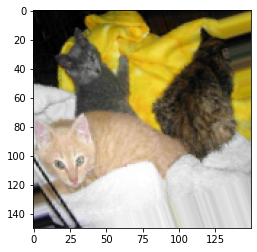

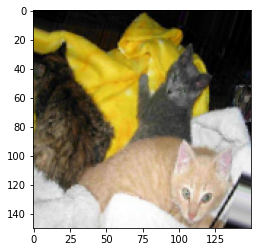

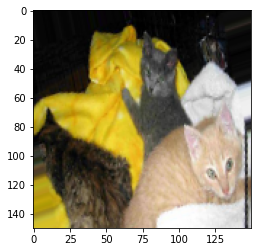

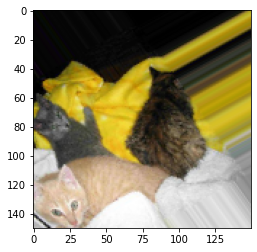

In [ ]:
# This is module with image preprocessing utilities
from keras.preprocessing import image

fnames = [os.path.join(train_cats_dir, fname) for fname in os.listdir(train_cats_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(150, 150))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

If we train a new network using this data augmentation configuration, our network will never see twice the same input. However, the inputs 
that it sees are still heavily intercorrelated, since they come from a small number of original images -- we cannot produce new information, 
we can only remix existing information. As such, this might not be quite enough to completely get rid of overfitting. To further fight 
overfitting, we will also add a Dropout layer to our model, right before the densely-connected classifier:

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Let's train our network using data augmentation and dropout:

In [ ]:
import math
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

history = model.fit_generator(
      train_generator,
      steps_per_epoch=STEP_SIZE_TRAIN,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=STEP_SIZE_VALID)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/100
62/62 [==============================] - 29s 418ms/step - loss: 0.6922 - acc: 0.5158 - val_loss: 0.6863 - val_acc: 0.5010
Epoch 2/100
62/62 [==============================] - 20s 331ms/step - loss: 0.6877 - acc: 0.5417 - val_loss: 0.6802 - val_acc: 0.5242
Epoch 3/100
62/62 [==============================] - 24s 385ms/step - loss: 0.6760 - acc: 0.5701 - val_loss: 0.6702 - val_acc: 0.5857
Epoch 4/100
62/62 [==============================] - 21s 335ms/step - loss: 0.6678 - acc: 0.5981 - val_loss: 0.6556 - val_acc: 0.5857
Epoch 5/100
62/62 [==============================] - 22s 352ms/step - loss: 0.6653 - acc: 0.5788 - val_loss: 0.7002 - val_acc: 0.5262
Epoch 6/100
62/62 [==============================] - 20s 330ms/step - loss: 0.6568 - acc: 0.5950 - val_loss: 0.6428 - val_acc: 0.6079
Epoch 7/100
62/62 [==============================] - 21s 333ms/step - loss: 0.6410 - acc: 0.6275 - val_loss: 0.6198 - val_acc: 0.6462
Epoch 8/100
62/62 [==============================] - 21s 335ms

Let's save our model -- we will be using it in the section on convnet visualization.

In [ ]:
model.save('cats_and_dogs_small_2.h5')

Let's plot our results again:

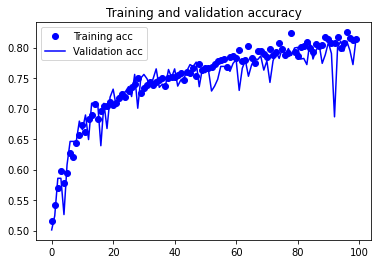

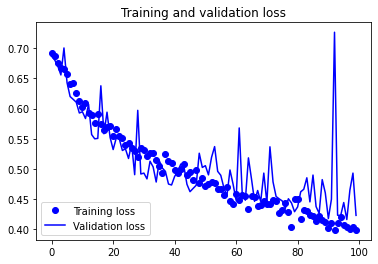

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Thanks to data augmentation and dropout, we are no longer overfitting: the training curves are rather closely tracking the validation 
curves. We are now able to reach an accuracy of 82%, a 15% relative improvement over the non-regularized model.

By leveraging regularization techniques even further and by tuning the network's parameters (such as the number of filters per convolution 
layer, or the number of layers in the network), we may be able to get an even better accuracy, likely up to 86-87%. However, it would prove 
very difficult to go any higher just by training our own convnet from scratch, simply because we have so little data to work with. As a 
next step to improve our accuracy on this problem, we will have to leverage a pre-trained model, which will be the focus of the next two 
sections.

## 2. (15 points) Start reducing the number of cats in the dataset and plot the accuracy of the predicting the cat class as the population of cats becomes 90%, 70%, 50%, 30%, 10% of the original. For each population size present the hyperparameter optimized result using AutoKeras. Explain your findings.

**The following code shows how I decreased the cats from 90% to 70% to 50% to 30% and 10%. As you can see as we have less cats in our training set our model becomes less accurate over every iteration. We see that the difference between our training accuracy and validation accuracy increase as we have less and less cats in the training model. This means that while we can train the cats accuretly when we try to validate cat pictures using our training model we get worse and worse results as our training model is not complete. The 90% training model is close to what the model should look like for 100% training model, but their is still a gap between the training model and validation model which continues to increase as more and more cats get deleted from our model.**

This is when we change the training set for the cats to 90%

In [ ]:
# Make train_cats_dir only 90% of orginal length (New Length should be 900)
count = 0
for file in os.scandir(train_cats_dir):
    os.remove(file)
    count+=1
    if count == 100:
      break

#Make validation_cats_dir only 90% of orginal length (New Length should be 450)
count = 0
for file in os.scandir(validation_cats_dir):
    os.remove(file)
    count+=1
    if count == 50:
      break
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))


total training cat images: 900
total validation cat images: 450


In [ ]:
import math
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

history = model.fit_generator(
      train_generator,
      steps_per_epoch=STEP_SIZE_TRAIN,
      epochs=32,
      validation_data=validation_generator,
      validation_steps=STEP_SIZE_VALID)

Found 1900 images belonging to 2 classes.
Found 950 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/32
59/59 [==============================] - 20s 332ms/step - loss: 0.3852 - acc: 0.8282 - val_loss: 0.4282 - val_acc: 0.8082
Epoch 2/32
59/59 [==============================] - 24s 408ms/step - loss: 0.3988 - acc: 0.8228 - val_loss: 0.5840 - val_acc: 0.7457
Epoch 3/32
59/59 [==============================] - 23s 385ms/step - loss: 0.3917 - acc: 0.8314 - val_loss: 0.4755 - val_acc: 0.7942
Epoch 4/32
59/59 [==============================] - 22s 379ms/step - loss: 0.4060 - acc: 0.8201 - val_loss: 0.4444 - val_acc: 0.8006
Epoch 5/32
59/59 [==============================] - 22s 379ms/step - loss: 0.3818 - acc: 0.8308 - val_loss: 0.4595 - val_acc: 0.7888
Epoch 6/32
59/59 [==============================] - 26s 438ms/step - loss: 0.3811 - acc: 0.8239 - val_loss: 0.4212 - val_acc: 0.8050
Epoch 7/32
59/59 [==============================] - 21s 348ms/step - loss: 0.3705 - acc: 0.8357 - val_loss: 0.4498 - val_acc: 0.7974
Epoch 8/32
59/59 [==============================] - 27s 451ms/step - 

In [ ]:
model.save('cats_and_dogs_small_3.h5')

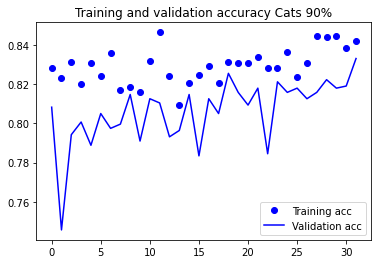

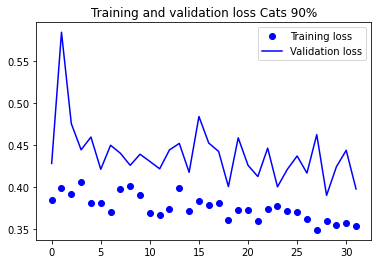

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy Cats 90%')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss Cats 90%')
plt.legend()

plt.show()

This is when we change the training set for the cats to 70%



In [ ]:
# Make train_cats_dir only 70% of orginal length (New Length should be 700)
count = 0
for file in os.scandir(train_cats_dir):
    os.remove(file)
    count+=1
    if count == 200:
      break

#Make validation_cats_dir only 70% of orginal length (New Length should be 350)
count = 0
for file in os.scandir(validation_cats_dir):
    os.remove(file)
    count+=1
    if count == 100:
      break
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))

total training cat images: 700
total validation cat images: 350


In [ ]:
import math
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

history = model.fit_generator(
      train_generator,
      steps_per_epoch=STEP_SIZE_TRAIN,
      epochs=32,
      validation_data=validation_generator,
      validation_steps=STEP_SIZE_VALID)
model.save('cats_and_dogs_small_4.h5')

Found 1700 images belonging to 2 classes.
Found 850 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/32
53/53 [==============================] - 18s 334ms/step - loss: 0.3477 - acc: 0.8507 - val_loss: 0.3965 - val_acc: 0.8269
Epoch 2/32
53/53 [==============================] - 17s 327ms/step - loss: 0.3478 - acc: 0.8579 - val_loss: 0.4054 - val_acc: 0.8293
Epoch 3/32
53/53 [==============================] - 18s 331ms/step - loss: 0.3423 - acc: 0.8519 - val_loss: 0.4763 - val_acc: 0.7837
Epoch 4/32
53/53 [==============================] - 20s 375ms/step - loss: 0.3267 - acc: 0.8483 - val_loss: 0.5290 - val_acc: 0.7861
Epoch 5/32
53/53 [==============================] - 18s 333ms/step - loss: 0.3431 - acc: 0.8459 - val_loss: 0.4216 - val_acc: 0.8113
Epoch 6/32
53/53 [==============================] - 18s 330ms/step - loss: 0.3332 - acc: 0.8453 - val_loss: 0.4116 - val_acc: 0.8125
Epoch 7/32
53/53 [==============================] - 18s 332ms/step - loss: 0.3259 - acc: 0.8621 - val_loss: 0.4322 - val_acc: 0.8041
Epoch 8/32
53/53 [==============================] - 18s 331ms/step - 

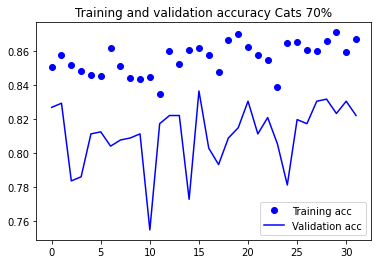

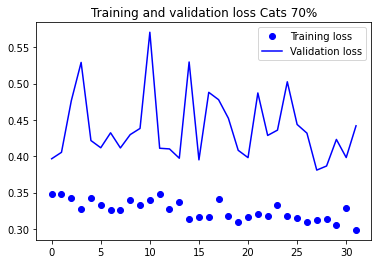

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy Cats 70%')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss Cats 70%')
plt.legend()

plt.show()

This is when we change the training set for the cats to 50%


In [ ]:
# Make train_cats_dir only 50% of orginal length (New Length should be 500)
count = 0
for file in os.scandir(train_cats_dir):
    os.remove(file)
    count+=1
    if count == 200:
      break

#Make validation_cats_dir only 50% of orginal length (New Length should be 250)
count = 0
for file in os.scandir(validation_cats_dir):
    os.remove(file)
    count+=1
    if count == 100:
      break
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))

total training cat images: 500
total validation cat images: 250


In [ ]:
import math
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

history = model.fit_generator(
      train_generator,
      steps_per_epoch=STEP_SIZE_TRAIN,
      epochs=32,
      validation_data=validation_generator,
      validation_steps=STEP_SIZE_VALID)
model.save('cats_and_dogs_small_5.h5')

Found 1500 images belonging to 2 classes.
Found 750 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/32
46/46 [==============================] - 16s 350ms/step - loss: 0.2916 - acc: 0.8842 - val_loss: 0.4389 - val_acc: 0.8139
Epoch 2/32
46/46 [==============================] - 16s 340ms/step - loss: 0.2896 - acc: 0.8822 - val_loss: 0.3967 - val_acc: 0.8370
Epoch 3/32
46/46 [==============================] - 15s 336ms/step - loss: 0.2937 - acc: 0.8692 - val_loss: 0.3906 - val_acc: 0.8438
Epoch 4/32
46/46 [==============================] - 16s 340ms/step - loss: 0.2881 - acc: 0.8685 - val_loss: 0.5084 - val_acc: 0.8016
Epoch 5/32
46/46 [==============================] - 16s 340ms/step - loss: 0.2921 - acc: 0.8699 - val_loss: 0.4480 - val_acc: 0.8274
Epoch 6/32
46/46 [==============================] - 16s 337ms/step - loss: 0.2937 - acc: 0.8685 - val_loss: 0.4666 - val_acc: 0.7962
Epoch 7/32
46/46 [==============================] - 16s 339ms/step - loss: 0.2644 - acc: 0.8862 - val_loss: 0.3912 - val_acc: 0.8356
Epoch 8/32
46/46 [==============================] - 16s 340ms/step - 

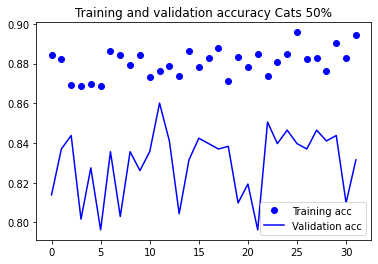

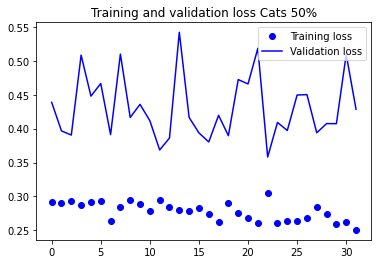

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy Cats 50%')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss Cats 50%')
plt.legend()

plt.show()

**This is when we change the training set for the cats to 30%**



In [ ]:
# Make train_cats_dir only 30% of orginal length (New Length should be 300)
count = 0
for file in os.scandir(train_cats_dir):
    os.remove(file)
    count+=1
    if count == 200:
      break

#Make validation_cats_dir only 30% of orginal length (New Length should be 150)
count = 0
for file in os.scandir(validation_cats_dir):
    os.remove(file)
    count+=1
    if count == 100:
      break
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))

total training cat images: 300
total validation cat images: 150


In [ ]:
import math
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

history = model.fit_generator(
      train_generator,
      steps_per_epoch=STEP_SIZE_TRAIN,
      epochs=32,
      validation_data=validation_generator,
      validation_steps=STEP_SIZE_VALID)
model.save('cats_and_dogs_small_6.h5')

Found 1300 images belonging to 2 classes.
Found 650 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/32
40/40 [==============================] - 14s 351ms/step - loss: 0.2137 - acc: 0.9022 - val_loss: 0.4617 - val_acc: 0.8203
Epoch 2/32
40/40 [==============================] - 14s 353ms/step - loss: 0.2063 - acc: 0.9117 - val_loss: 0.3803 - val_acc: 0.8687
Epoch 3/32
40/40 [==============================] - 14s 341ms/step - loss: 0.2340 - acc: 0.8959 - val_loss: 0.3195 - val_acc: 0.8797
Epoch 4/32
40/40 [==============================] - 14s 348ms/step - loss: 0.2411 - acc: 0.8998 - val_loss: 0.3350 - val_acc: 0.8672
Epoch 5/32
40/40 [==============================] - 14s 349ms/step - loss: 0.2319 - acc: 0.9030 - val_loss: 0.3411 - val_acc: 0.8672
Epoch 6/32
40/40 [==============================] - 14s 341ms/step - loss: 0.2165 - acc: 0.9077 - val_loss: 0.3508 - val_acc: 0.8672
Epoch 7/32
40/40 [==============================] - 14s 344ms/step - loss: 0.2190 - acc: 0.9046 - val_loss: 0.4576 - val_acc: 0.8234
Epoch 8/32
40/40 [==============================] - 14s 342ms/step - 

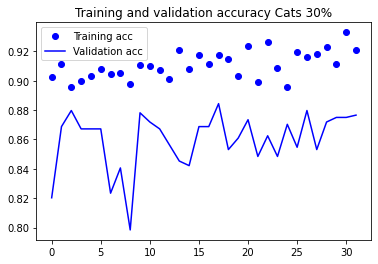

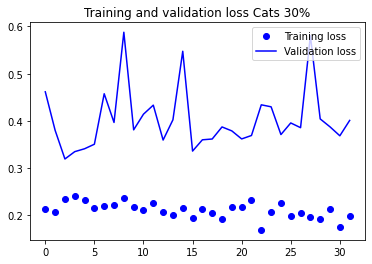

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy Cats 30%')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss Cats 30%')
plt.legend()

plt.show()

**This is when we change the training set for the cats to 10%**


In [ ]:
# Make train_cats_dir only 10% of orginal length (New Length should be 100)
count = 0
for file in os.scandir(train_cats_dir):
    os.remove(file)
    count+=1
    if count == 200:
      break

#Make validation_cats_dir only 10% of orginal length (New Length should be 50)
count = 0
for file in os.scandir(validation_cats_dir):
    os.remove(file)
    count+=1
    if count == 100:
      break
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))

total training cat images: 100
total validation cat images: 50


In [ ]:
import math
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(150, 150),
        batch_size=32,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

history = model.fit_generator(
      train_generator,
      steps_per_epoch=STEP_SIZE_TRAIN,
      epochs=32,
      validation_data=validation_generator,
      validation_steps=STEP_SIZE_VALID)
model.save('cats_and_dogs_small_7.h5')

Found 1100 images belonging to 2 classes.
Found 550 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/32
34/34 [==============================] - 11s 334ms/step - loss: 0.1089 - acc: 0.9579 - val_loss: 0.2264 - val_acc: 0.9136
Epoch 2/32
34/34 [==============================] - 11s 329ms/step - loss: 0.1157 - acc: 0.9569 - val_loss: 0.2096 - val_acc: 0.9449
Epoch 3/32
34/34 [==============================] - 11s 324ms/step - loss: 0.1194 - acc: 0.9569 - val_loss: 0.2509 - val_acc: 0.9246
Epoch 4/32
34/34 [==============================] - 11s 326ms/step - loss: 0.1118 - acc: 0.9560 - val_loss: 0.2194 - val_acc: 0.9099
Epoch 5/32
34/34 [==============================] - 11s 328ms/step - loss: 0.1061 - acc: 0.9560 - val_loss: 0.2751 - val_acc: 0.9136
Epoch 6/32
34/34 [==============================] - 11s 325ms/step - loss: 0.1328 - acc: 0.9494 - val_loss: 0.2649 - val_acc: 0.9062
Epoch 7/32
34/34 [==============================] - 11s 330ms/step - loss: 0.1041 - acc: 0.9607 - val_loss: 0.3994 - val_acc: 0.8824
Epoch 8/32
34/34 [==============================] - 11s 328ms/step - 

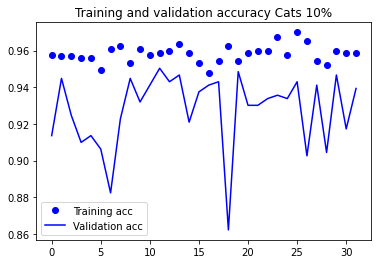

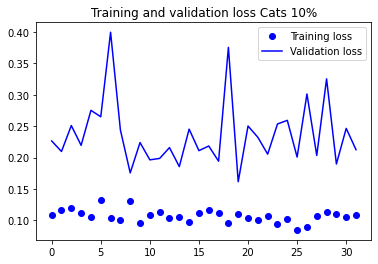

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy Cats 10%')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss Cats 10%')
plt.legend()

plt.show()

#Problem Set 3 (25 points)

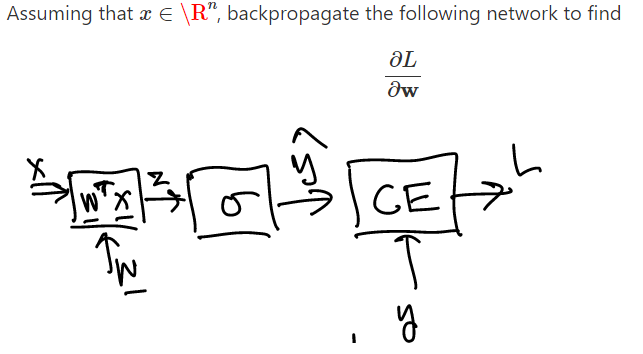

My answer is as follows in the pictures of my work

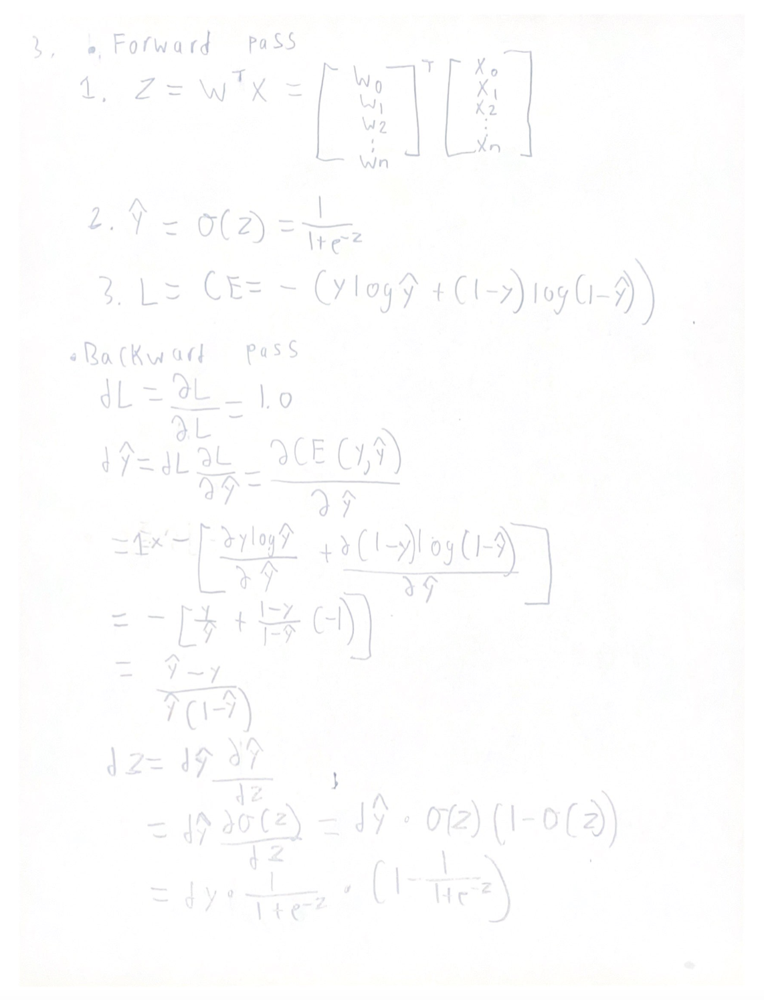

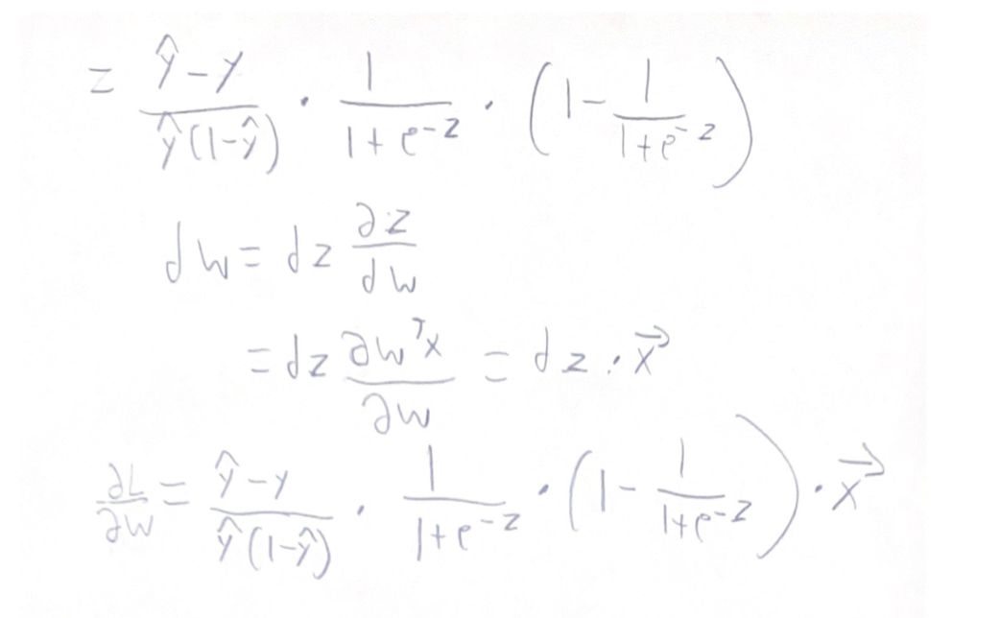